Student ID number: 201799763

In [1]:
# Import packages
import geopandas as gpd
import pandas as pd

import numpy as np
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns

!pip install mapclassify

In [2]:
# Load the cirme dataset. Data downloaded from https://data.police.uk/data/
from google.colab import files
crime = files.upload()

Saving 2021-11-west-yorkshire-outcomes.csv to 2021-11-west-yorkshire-outcomes.csv


The table displays the crime data obtained from West Yorkshire Police, listing all the recorded crimes in November 2021 within West Yorkshire[1].

In [3]:
# Read in the data and have a look at the dataframe
crime = pd.read_csv('2021-11-west-yorkshire-outcomes.csv')
crime.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Outcome type
0,bc2c41e91c6165be8d4d17728609f79892221d588b782e...,2021-11,West Yorkshire Police,West Yorkshire Police,NaN,NaN,No location,NaN,NaN,Unable to prosecute suspect
1,f19c85cfd6572c8c84397e7eb6499ebe561527e147c380...,2021-11,West Yorkshire Police,West Yorkshire Police,NaN,NaN,No location,NaN,NaN,Investigation complete; no suspect identified
2,f5b9626175a927c4bb03bc31bf2cad09049b50e8c599ab...,2021-11,West Yorkshire Police,West Yorkshire Police,NaN,NaN,No location,NaN,NaN,Unable to prosecute suspect
3,3911b614d80ccb4d0106f308455a390c33c850b7fe72ea...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.483462,53.789288,On or near LEVENS GARTH,E01011624,Leeds 072D,Investigation complete; no suspect identified
4,3b18a396f9c77eb53905933ad30a32d0328378e0ec55df...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.836485,53.688571,On or near CENTURY ROAD,E01010889,Calderdale 025A,Investigation complete; no suspect identified


In [4]:
# Remove the rows with null values and check the result
data=pd.DataFrame(crime).dropna()
data.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Outcome type
3,3911b614d80ccb4d0106f308455a390c33c850b7fe72ea...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.483462,53.789288,On or near LEVENS GARTH,E01011624,Leeds 072D,Investigation complete; no suspect identified
4,3b18a396f9c77eb53905933ad30a32d0328378e0ec55df...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.836485,53.688571,On or near CENTURY ROAD,E01010889,Calderdale 025A,Investigation complete; no suspect identified
6,be0903dd7302d76e5c2d47bfca0c6a22ea84722f8b755f...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.362931,53.670685,On or near VERNER STREET,E01011780,Wakefield 027B,Unable to prosecute suspect
8,d5fc7a064816926653105c5a16faf72f24a0427bd64fd1...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.470919,53.769226,On or near Park/Open Space,E01011639,Leeds 100E,Investigation complete; no suspect identified
12,f5c9d5c7ca633ed83f29498b2022790a9b84c80642ac71...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.759988,53.834704,On or near SAMUEL WAY,E01010779,Bradford 021C,Unable to prosecute suspect


In [5]:
# Extract data on the Leeds region and check it
leeds_data=data.loc[data['LSOA name'].str.contains('Leeds')]
leeds_data.head()

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Outcome type
3,3911b614d80ccb4d0106f308455a390c33c850b7fe72ea...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.483462,53.789288,On or near LEVENS GARTH,E01011624,Leeds 072D,Investigation complete; no suspect identified
8,d5fc7a064816926653105c5a16faf72f24a0427bd64fd1...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.470919,53.769226,On or near Park/Open Space,E01011639,Leeds 100E,Investigation complete; no suspect identified
43,3cc778d8d469f1e22549a578475a00b27be36db52794f6...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.457559,53.816992,On or near YORK ROAD,E01011665,Leeds 050C,Investigation complete; no suspect identified
56,f6bc25cf3d28325b0852b0b105c854d2385132ae228444...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.508889,53.813834,On or near CHATSWORTH CLOSE,E01011430,Leeds 053A,Investigation complete; no suspect identified
57,672ece1aa610036c99262cc63e78c7a8e012cd0c73a5fe...,2021-11,West Yorkshire Police,West Yorkshire Police,-1.653568,53.817215,On or near HORTON CLOSE,E01011327,Leeds 052A,Unable to prosecute suspect


In [6]:
# Calculation of the number of crimes per region
leeds_crime = pd.DataFrame(leeds_data['LSOA code'].value_counts()).reset_index()
leeds_crime.head()

,LSOA code,count
0,E01033010,631
1,E01033016,129
2,E01033011,121
3,E01033008,117
4,E01011467,85


In [7]:
# Look at the overview
leeds_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 477 entries, 0 to 476
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   LSOA code  477 non-null    object
 1   count      477 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 7.6+ KB


In [8]:
# Load the unemployment dataset. Data downloaded from https://www.nomisweb.co.uk/sources/census_2021_bulk
from google.colab import files
unemployment = files.upload()

Saving census2021-lsoa.csv to census2021-lsoa.csv


This table displays the unemployment history data from the 2021 UK Census[2].

In [9]:
# Read in the unemployment data and look at the first 5 rows of the dataframe
unemployment = pd.read_csv('census2021-lsoa.csv')
unemployment.head()

,date,geography,geography code,Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked
0,2021,City of London 001A,E01000001,486,83,346,57
1,2021,City of London 001B,E01000002,418,52,286,80
2,2021,City of London 001C,E01000003,504,105,331,68
3,2021,City of London 001E,E01000005,463,73,165,225
4,2021,Barking and Dagenham 016A,E01000006,544,78,223,243


In [10]:
# Extract Leeds unemployment data and check it
leeds_unemployment =unemployment.loc[unemployment['geography'].str.contains('Leeds')]
leeds_unemployment.head()

,date,geography,geography code,Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked
10719,2021,Leeds 011A,E01011264,523,45,372,106
10720,2021,Leeds 009A,E01011265,644,66,465,113
10721,2021,Leeds 008A,E01011266,670,79,515,76
10722,2021,Leeds 009B,E01011267,600,50,402,148
10723,2021,Leeds 010A,E01011268,462,56,292,114


In [11]:
# Load the resident population dataset. Data downloaded from https://www.nomisweb.co.uk/sources/census_2021_bulk
from google.colab import files
total = files.upload()

Saving census2021-ts001-lsoa.csv to census2021-ts001-lsoa.csv


This table shows the number of usual residents in households and communal establishments recorded in the 2021 Census[2].

In [12]:
# Read in the resident population data and look at the first 5 rows
total = pd.read_csv('census2021-ts001-lsoa.csv')
total.head()

,date,geography,geography code,Residence type: Total; measures: Value,Residence type: Lives in a household; measures: Value,Residence type: Lives in a communal establishment; measures: Value
0,2021,Hartlepool 001A,E01011954,2284,2284,0
1,2021,Hartlepool 001B,E01011969,1344,1344,0
2,2021,Hartlepool 001C,E01011970,1070,1070,0
3,2021,Hartlepool 001D,E01011971,1323,1323,0
4,2021,Hartlepool 001F,E01033465,1955,1955,0


In [13]:
# Extract Leeds resident population data and look at the first 5 rows
leeds_total=total.loc[total['geography'].str.contains('Leeds')]
leeds_total.head()

,date,geography,geography code,Residence type: Total; measures: Value,Residence type: Lives in a household; measures: Value,Residence type: Lives in a communal establishment; measures: Value
8901,2021,Leeds 001A,E01011698,1462,1460,2
8902,2021,Leeds 001B,E01011699,1289,1289,0
8903,2021,Leeds 001C,E01011701,1367,1367,0
8904,2021,Leeds 001D,E01011702,1648,1648,0
8905,2021,Leeds 001E,E01011703,1224,1224,0


In [14]:
# This project only requires the number of residents, regardless of residence type, so select the total value. The 'geography code' variable is left in for later data processing.
value_total=leeds_total[['geography code','Residence type: Total; measures: Value']]
value_total.head()

,geography code,Residence type: Total; measures: Value
8901,E01011698,1462
8902,E01011699,1289
8903,E01011701,1367
8904,E01011702,1648
8905,E01011703,1224


In [15]:
# Join the Leeds unemployment data to the Leeds crime data using a lefthand join
crime_unemploy =leeds_crime.merge(leeds_unemployment, how='left',left_on='LSOA code',right_on='geography code')
crime_unemploy.head()

,LSOA code,count,date,geography,geography code,Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked
0,E01033010,631,2021.0,Leeds 111B,E01033010,2690.0,817.0,401.0,1472.0
1,E01033016,129,2021.0,Leeds 111E,E01033016,213.0,73.0,74.0,66.0
2,E01033011,121,2021.0,Leeds 111C,E01033011,391.0,152.0,111.0,128.0
3,E01033008,117,2021.0,Leeds 111A,E01033008,1507.0,601.0,269.0,637.0
4,E01011467,85,2021.0,Leeds 112A,E01011467,671.0,70.0,401.0,200.0


In [16]:
# Join the Leeds resident population data to the outcome data
total_crime =crime_unemploy.merge(value_total, how='left',left_on='geography code',right_on='geography code')
total_crime.head()

,LSOA code,count,date,geography,geography code,Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value
0,E01033010,631,2021.0,Leeds 111B,E01033010,2690.0,817.0,401.0,1472.0,3481.0
1,E01033016,129,2021.0,Leeds 111E,E01033016,213.0,73.0,74.0,66.0,1047.0
2,E01033011,121,2021.0,Leeds 111C,E01033011,391.0,152.0,111.0,128.0,1344.0
3,E01033008,117,2021.0,Leeds 111A,E01033008,1507.0,601.0,269.0,637.0,2148.0
4,E01011467,85,2021.0,Leeds 112A,E01011467,671.0,70.0,401.0,200.0,1992.0


In [17]:
# Calcualte the percentage of the popualtion that are never worked
total_crime['Percent_unemployment']= (total_crime['Unemployment history: Not in employment: Never worked']/total_crime['Residence type: Total; measures: Value'])*100

In [19]:
# Check the result
total_crime.head()

,LSOA code,count,date,geography,geography code,Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value,Percent_unemployment
0,E01033010,631,2021.0,Leeds 111B,E01033010,2690.0,817.0,401.0,1472.0,3481.0,42.286699
1,E01033016,129,2021.0,Leeds 111E,E01033016,213.0,73.0,74.0,66.0,1047.0,6.303725
2,E01033011,121,2021.0,Leeds 111C,E01033011,391.0,152.0,111.0,128.0,1344.0,9.523810
3,E01033008,117,2021.0,Leeds 111A,E01033008,1507.0,601.0,269.0,637.0,2148.0,29.655493
4,E01011467,85,2021.0,Leeds 112A,E01011467,671.0,70.0,401.0,200.0,1992.0,10.040161


'Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census' is the sum of the next three variables, so it doesn't need to be analyzed. 'geography code' is the same as 'LSOA code', so only one needs to be kept. 'data' is 2021 and does not need to be retained.

In [18]:
# Clean redundant data.
clean_data=total_crime.drop(columns =['geography code','date','Unemployment history: Total: All usual residents aged 16 years and over not in employment the week before the census'])
clean_data.head()

,LSOA code,count,geography,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value,Percent_unemployment
0,E01033010,631,Leeds 111B,817.0,401.0,1472.0,3481.0,42.286699
1,E01033016,129,Leeds 111E,73.0,74.0,66.0,1047.0,6.303725
2,E01033011,121,Leeds 111C,152.0,111.0,128.0,1344.0,9.523810
3,E01033008,117,Leeds 111A,601.0,269.0,637.0,2148.0,29.655493
4,E01011467,85,Leeds 112A,70.0,401.0,200.0,1992.0,10.040161


In [22]:
# Look at the overview
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 477 entries, 0 to 476
Data columns (total 8 columns):
 #   Column                                                                     Non-Null Count  Dtype  
---  ------                                                                     --------------  -----  
 0   LSOA code                                                                  477 non-null    object 
 1   count                                                                      477 non-null    int64  
 2   geography                                                                  468 non-null    object 
 3   Unemployment history: Not in employment: Worked in the last 12 months      468 non-null    float64
 4   Unemployment history: Not in employment: Not worked in the last 12 months  468 non-null    float64
 5   Unemployment history: Not in employment: Never worked                      468 non-null    float64
 6   Residence type: Total; measures: Value                     

In [19]:
# Calculate the correlation
clean_data_numeric = clean_data.select_dtypes(include=np.number)
clean_data_numeric.corr()

,count,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value,Percent_unemployment
count,1.000000,0.332525,-0.054274,0.665503,0.328910,0.528143
Unemployment history: Not in employment: Worked in the last 12 months,0.332525,1.000000,0.215232,0.600542,0.533171,0.422142
Unemployment history: Not in employment: Not worked in the last 12 months,-0.054274,0.215232,1.000000,0.008270,0.359403,-0.183229
Unemployment history: Not in employment: Never worked,0.665503,0.600542,0.008270,1.000000,0.635532,0.906704
Residence type: Total; measures: Value,0.328910,0.533171,0.359403,0.635532,1.000000,0.366357
Percent_unemployment,0.528143,0.422142,-0.183229,0.906704,0.366357,1.000000


<Axes: >

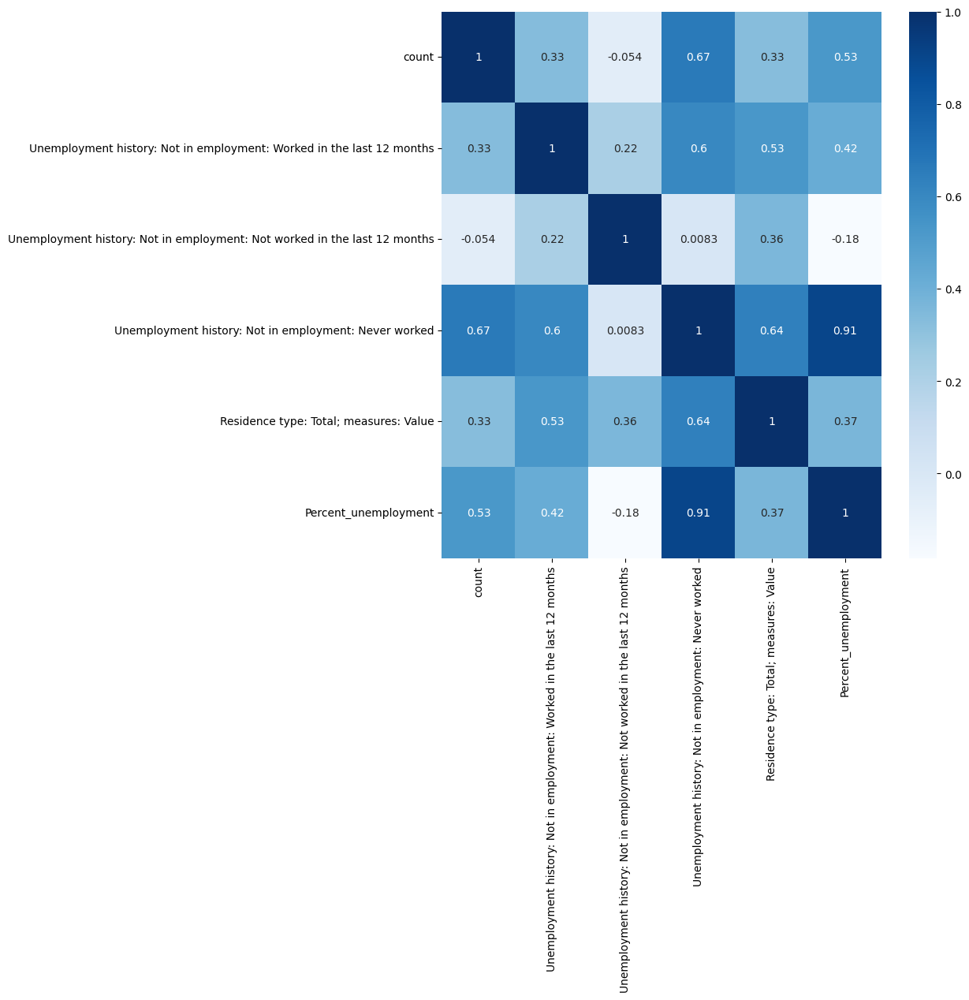

In [20]:
# Create a heatmap of the correlation table
plt.figure(figsize=(9,9))
sns.heatmap(clean_data_numeric.corr(), annot=True, cmap='Blues')

***Because the following file is too large, I can't upload this file to Turnitin. Please use the Leeds.geojson file directly.***

In [40]:
# Load the LSOA shp file. Data downloaded from https://geoportal.statistics.gov.uk/maps/761ecd09b4124843b95511a242e2b1a1
from google.colab import files
shp = files.upload()

Saving Lower_layer_Super_Output_Areas_2021_EW_BFE_V9_-3647710721716634062.geojson to Lower_layer_Super_Output_Areas_2021_EW_BFE_V9_-3647710721716634062.geojson


Because of this file is quite large, it will take a long time to download. To save time, filter out the data for the Leeds area and save it. You can use the 'Leeds.geojson' file directly.

In [41]:
# Select the map of the Leeds area
shp =gpd.read_file('Lower_layer_Super_Output_Areas_2021_EW_BFE_V9_-3647710721716634062.geojson')
leeds =shp.loc[shp['LSOA21NM'].str.contains('Leeds')]

In [64]:
# Save the Leeds shp file
leeds_shp=leeds.to_file('Leeds.geojson')
from google.colab import files
files.download('Leeds.geojson')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
# If you use the 'Leeds.geojson' file directly, run the following code
from google.colab import files
leeds = files.upload()
leeds =gpd.read_file('Leeds.geojson')

Saving Leeds.geojson to Leeds.geojson


In [22]:
# Look at the first 5 rows of the dataframe
leeds.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.073 44..."
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635.000 442559.000, 418637.555 44..."
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44..."
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44..."
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44..."


In [23]:
# Look at the map to check it
leeds.explore()

In [24]:
# Join the clean_data to the Leeds shape file and check it.
shp_data =leeds.merge(clean_data, how='left',left_on='LSOA21CD',right_on='LSOA code')
shp_data.head()

,FID,LSOA21CD,LSOA21NM,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,LSOA code,count,geography,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value,Percent_unemployment
0,10720,E01011264,Leeds 011A,420937,441836,-1.68306,53.87232,14a73329-fc8f-464c-a4fa-1963baa35500,"POLYGON ((421248.688 442315.812, 421284.073 44...",E01011264,3.0,Leeds 011A,45.0,372.0,106.0,1284.0,8.255452
1,10721,E01011265,Leeds 009A,418988,441951,-1.71269,53.87343,eda471dd-f408-4dab-917e-c5e188310b35,"POLYGON ((418635.000 442559.000, 418637.555 44...",E01011265,29.0,Leeds 009A,66.0,465.0,113.0,1955.0,5.780051
2,10722,E01011266,Leeds 008A,417489,442615,-1.73545,53.87945,286c32c5-ef49-4ecc-a45e-57630c165c62,"POLYGON ((417783.688 443382.312, 417788.688 44...",E01011266,5.0,Leeds 008A,79.0,515.0,76.0,2613.0,2.908534
3,10723,E01011267,Leeds 009B,419641,442025,-1.70276,53.87407,318cfaa3-9f08-4d61-a30e-82e903f3a7ba,"POLYGON ((419607.843 442388.568, 419612.752 44...",E01011267,15.0,Leeds 009B,50.0,402.0,148.0,1699.0,8.711006
4,10724,E01011268,Leeds 010A,420224,441935,-1.69390,53.87324,049e79f0-cd9e-47dc-848b-b6d6fa6825ac,"POLYGON ((420442.406 442436.687, 420443.313 44...",E01011268,19.0,Leeds 010A,56.0,292.0,114.0,1395.0,8.172043


**Data Visualisation**

The figure below shows the result of the final spatial visualization.

Previous study has shown that the unemployment rate of specific groups is related to crime[3]. So the following indicators were selected.

The map shows the spatial distribution of all the variables, with darker colors representing higher numbers. By looking at the spatial distribution of these variables, it is obvious which variables have similarities to the spatial distribution of the number of crimes.

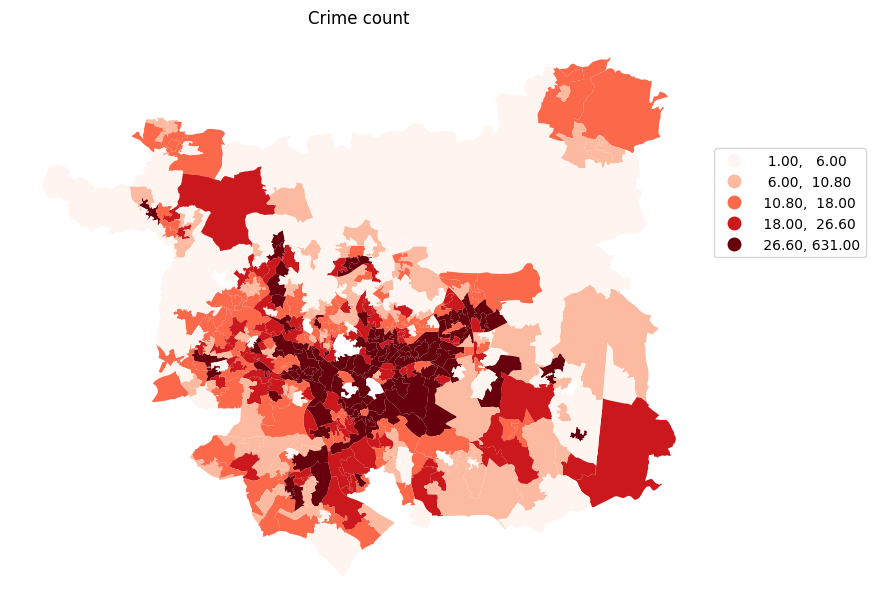

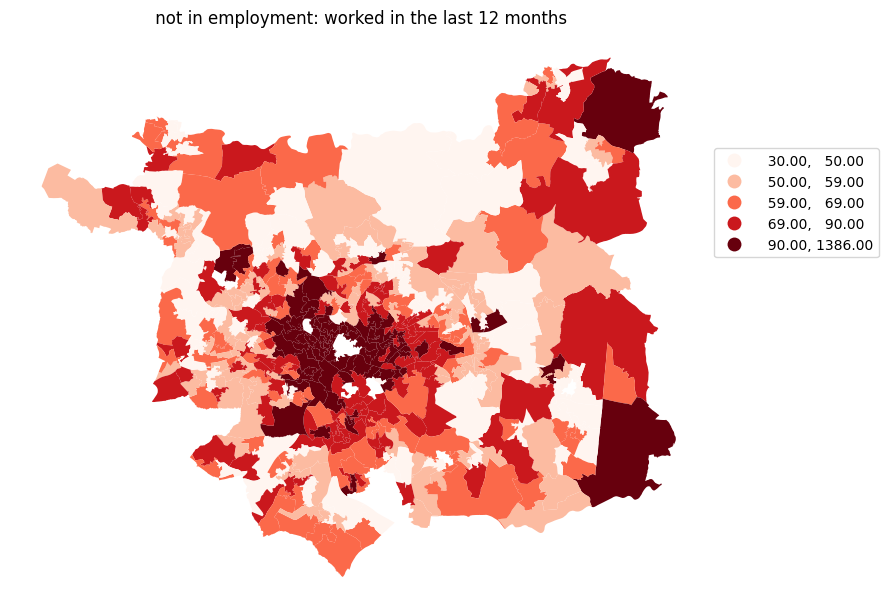

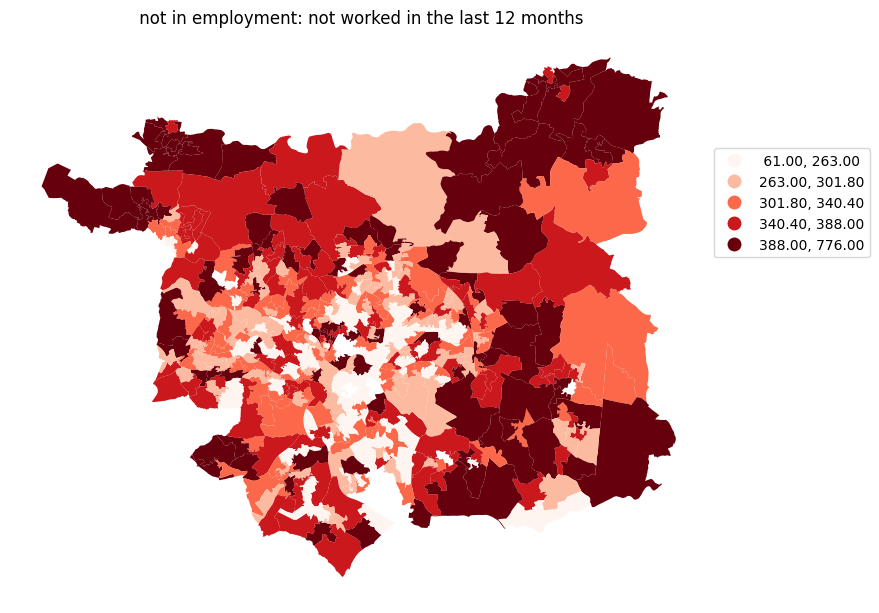

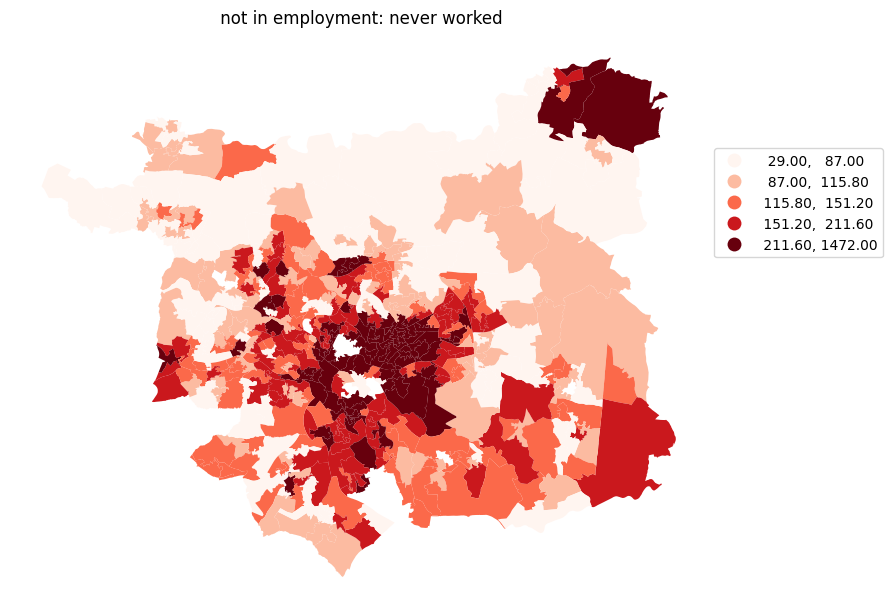

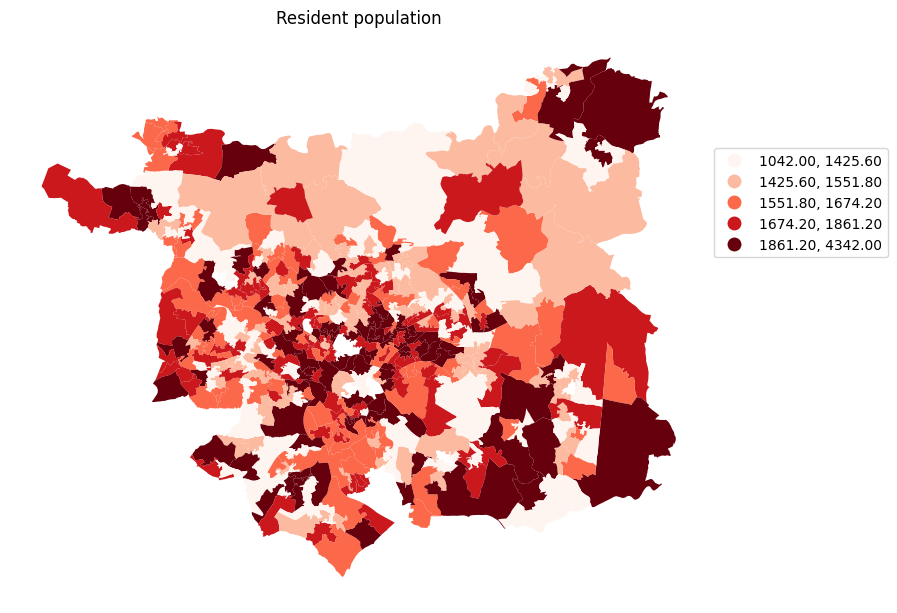

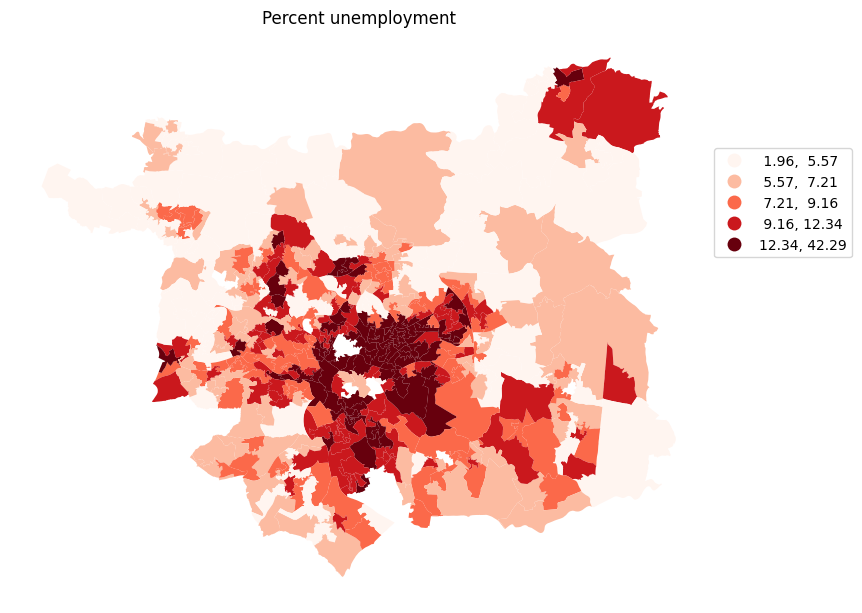

In [29]:
# Create a list of the columns to plot
plot_columns =['count',
       'Unemployment history: Not in employment: Worked in the last 12 months',
       'Unemployment history: Not in employment: Not worked in the last 12 months',
       'Unemployment history: Not in employment: Never worked',
       'Residence type: Total; measures: Value', 'Percent_unemployment']


# for each item in a range
for i in range (0,len(plot_columns)):

    # produce a plot
    fig, ax = plt.subplots(1, 1, figsize=(9, 9))

    # get the ith item
    shp_data.plot(column=plot_columns[i],

    # reduce linewidth between polygons
    linewidth =0.1,
    # specify data is categorical
    categorical=True,
    # show the legend
    legend=True,
    # define the legend palette
    cmap='Reds',
    # define the legend style
    scheme='quantiles',
    # use the define axis
    ax=ax,
    # position the legend
    legend_kwds={'loc': 'center left','bbox_to_anchor':(1,0.7)})

    # add a title based on the column plotted, formatting the title to look better
    plt.title(plot_columns[i].replace('_',' ').replace('Unemployment history:','').replace('count','crime count').replace('Residence type: Total; measures: Value','Resident population').capitalize())

    # do not plot with the axis showing
    plt.axis('off')

    # save the figure as an image
    plt.savefig(str(plot_columns[i])+'_'+'Leeds'+'.jpg',bbox_inches='tight')

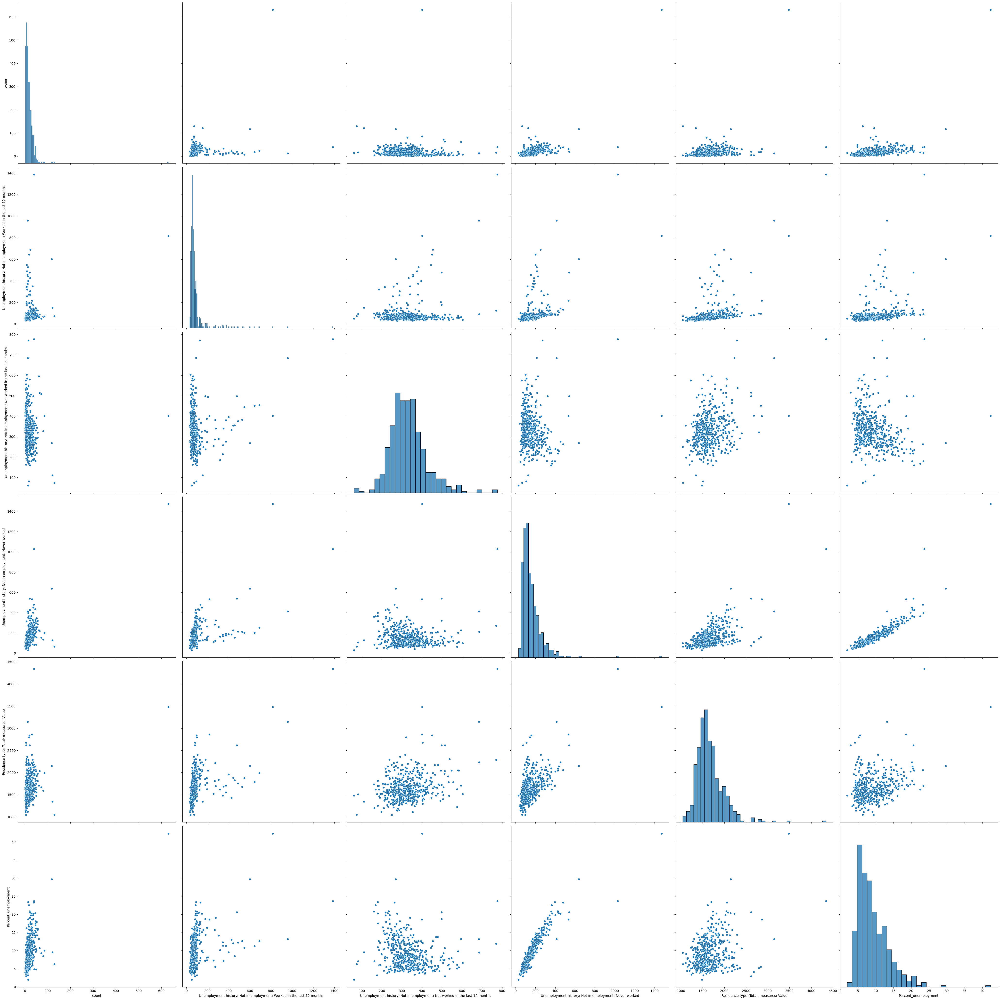

In [49]:
# Plot pairplot and adjust to a suitable height
sns.pairplot(shp_data[['count',
       'Unemployment history: Not in employment: Worked in the last 12 months',
       'Unemployment history: Not in employment: Not worked in the last 12 months',
       'Unemployment history: Not in employment: Never worked',
       'Residence type: Total; measures: Value', 'Percent_unemployment']], height=7)

In [26]:
# Calculate Spearman's rank correlation
Spearman_corr =shp_data[['count',
       'Unemployment history: Not in employment: Worked in the last 12 months',
       'Unemployment history: Not in employment: Not worked in the last 12 months',
       'Unemployment history: Not in employment: Never worked',
       'Residence type: Total; measures: Value', 'Percent_unemployment']].corr(method = 'spearman')
# Look at the result
Spearman_corr

,count,Unemployment history: Not in employment: Worked in the last 12 months,Unemployment history: Not in employment: Not worked in the last 12 months,Unemployment history: Not in employment: Never worked,Residence type: Total; measures: Value,Percent_unemployment
count,1.000000,0.482384,-0.225431,0.657215,0.357927,0.623179
Unemployment history: Not in employment: Worked in the last 12 months,0.482384,1.000000,-0.116030,0.614741,0.604606,0.483617
Unemployment history: Not in employment: Not worked in the last 12 months,-0.225431,-0.116030,1.000000,-0.158816,0.231039,-0.280579
Unemployment history: Not in employment: Never worked,0.657215,0.614741,-0.158816,1.000000,0.548351,0.943481
Residence type: Total; measures: Value,0.357927,0.604606,0.231039,0.548351,1.000000,0.266812
Percent_unemployment,0.623179,0.483617,-0.280579,0.943481,0.266812,1.000000


**Data Visualisation**

The figure below shows the result of the final non-spatial visualization.

The Spearman's rank model is a very common model for analyzing the correlation between data, the results it presents are simple and easy to distinguish, and it has robustness and ability to capture nonlinear correlations[4].

Using the Spearman's rank model, we can determine the correlation between the number of crimes and the selected variables.

Labels: Index(['count',
       'Unemployment history: Not in employment: Worked in the last 12 months',
       'Unemployment history: Not in employment: Not worked in the last 12 months',
       'Unemployment history: Not in employment: Never worked',
       'Residence type: Total; measures: Value', 'Percent unemployment'],
      dtype='object') Index(['count',
       'Unemployment history: Not in employment: Worked in the last 12 months',
       'Unemployment history: Not in employment: Not worked in the last 12 months',
       'Unemployment history: Not in employment: Never worked',
       'Residence type: Total; measures: Value', 'Percent unemployment'],
      dtype='object')
Labels with capital letters: ['Count', 'Unemployment history: not in employment: worked in the last 12 months', 'Unemployment history: not in employment: not worked in the last 12 months', 'Unemployment history: not in employment: never worked', 'Residence type: total; measures: value', 'Percent unemployment'] 

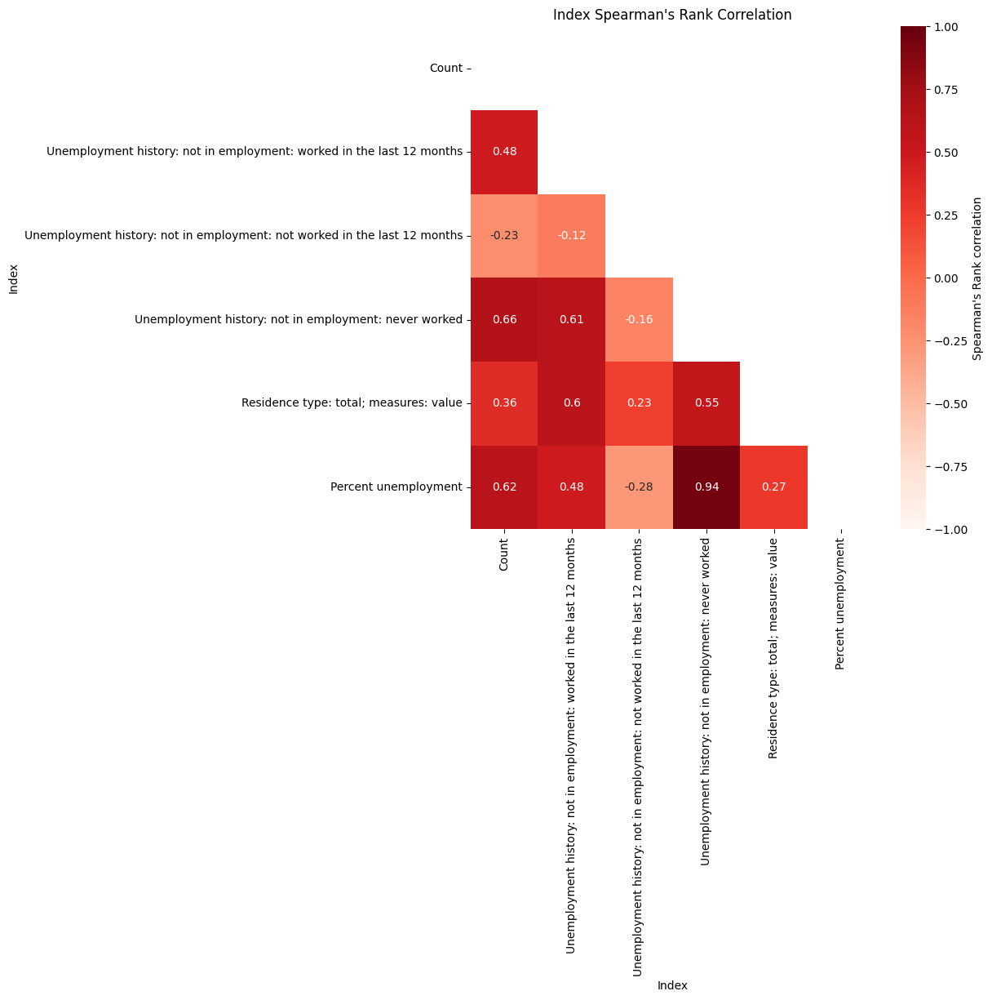

In [28]:
# Define plot size
fig,ax = plt.subplots(figsize=(8,8))

# define mask to apply to upper right hand corner of the plot
data_to_mask = np.triu(np.ones_like(Spearman_corr))

# define axis tick labels and get the index and the columns
x_axis_labels = Spearman_corr.columns.str.replace('_',' ')
y_axis_labels = Spearman_corr.index.str.replace('_',' ')

# print the tick labels
print('Labels:',x_axis_labels ,y_axis_labels)

# for each element in the list of x_axis_labels, capitalize it
x_axis_labels = [element.capitalize() for element in x_axis_labels]
y_axis_labels = [element.capitalize() for element in y_axis_labels]

# look at the new labels
print('Labels with capital letters:',x_axis_labels ,y_axis_labels)


# plot a heatmap of the correlation dataframe
sns.heatmap(Spearman_corr,
            # annotate so spearman's rank correlation values are displayed on the squares
            annot=True,
            # define colourmap
            cmap='Reds',
            # define value of minimum colour
            vmin=-1,
            # define value of maximum colour
            vmax=1,
            # add the mask
            mask=data_to_mask,
            # use the custom tick labels
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels,
            # add a label
            cbar_kws={'label': "Spearman's Rank correlation"},
            # plot on the axis
            ax=ax)

# Set axis labels
ax.set(xlabel="Index",
       ylabel="Index",
      title ="Index Spearman's Rank Correlation" );
plt.savefig('Index_Correlation.png')

**References**

[1] DATA.POLICE.UK. 2024. Leeds City. [Online]. [Accessed 23 May 2024]. Available from: https://www.police.uk/pu/your-area/west-yorkshire-police/leeds-city?tab=crimemap

[2] nomis. 2024. Census 2021 Bulk Data Download. [Online]. [Accessed 23 May 2024]. Available from: https://www.nomisweb.co.uk/sources/census_2021_bulk

[3] Massourakis, M., Rezvani, F. and Yamada, T. 1984. Occupation, Race, Unemployment and Crime In a Dynamic System. Cambridge, Mass: National Bureau of Economic Research.

[4] Eden, S.K., Li, C. and Shepherd, B.E. 2022. Nonparametric estimation of Spearman's rank correlation with bivariate survival data. Biometrics. 78(2), pp.421-434.

